# Проект "Рынок заведений общественного питания Москвы"

**Описание и цель проекта:**

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
Моя задача как аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
Постараюсь сделать презентацию информативной и лаконичной. 
Мне доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

**Описание данных:**

Датасет moscow_places.csv: 
    
    name — название заведения;
    address — адрес заведения;
    category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
    hours — информация о днях и часах работы;
    lat — широта географической точки, в которой находится заведение;
    lng — долгота географической точки, в которой находится заведение;
    rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
    price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
    avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
        «Средний счёт: 1000–1500 ₽»;
        «Цена чашки капучино: 130–220 ₽»;
        «Цена бокала пива: 400–600 ₽».
        и так далее;
    middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
        Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
        middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
        Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
    chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
        0 — заведение не является сетевым
        1 — заведение является сетевым
    district — административный район, в котором находится заведение, например Центральный административный округ;
    seats — количество посадочных мест.

In [1]:
# импорт библиотек
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px 
import folium
import json
import numpy as np
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from plotly import graph_objects as go
from folium.plugins import HeatMap

In [2]:
# считаем CSV-файл с данными с помощью библиотеки pandas и сохраним в датафрейм
df = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
# выведем первые 10 cтрок таблицы df
df.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


In [4]:
# посмотрим общую информацию о таблице df
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [5]:
# определим количество представленных заведений
# приведем наименования заведений к нижнему регистру
df['name'] = df['name'].str.lower()
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [6]:
print(f'В df представленно заведений -  {df["name"].nunique()}')

В df представленно заведений -  5512


**Вывод**

Были загружены данные о заведениях общественного питания Москвы. Привели наименования заведений к нижнему регистру и определили количество уникальных заведений - 5512. 
Видим в данных df 8406 строк и 14 столбцов, вес датафрейма - 919.5+ KB; столбец chain имеет тип данных int64; столбцы name, category, address, district, hours, price, avg_bill - имеет тип данных - object; lat, lng, rating, middle_avg_bill, middle_coffee_cup, seats - имеют тип данных float64.     

## Предобработка данных

In [7]:
# заменим букву ё на е для простоты восприятия
df = df.replace('ё', 'е')

### Проверка наличия пропущенных значений и дубликатов в датафрейме и их обработка

In [8]:
# посчитаем количество пропущенных значений в датафрейме
print(f'Количество пропущенных значений в df: {df.isna().sum()}')

Количество пропущенных значений в df: name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64


In [9]:
# посчитаем долю пропусков
pd.DataFrame(round(df.isna().mean()*100,1)).style.background_gradient('coolwarm')

,0
name,0.000000
category,0.000000
address,0.000000
district,0.000000
hours,6.400000
lat,0.000000
lng,0.000000
rating,0.000000
price,60.600000
avg_bill,54.600000


Видим пропуски в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup и seats, их количество превышает 5%, поэтому оставляем пропущенные значения, так как их удаление может повлиять на дальнейший анализ.

In [10]:
# посчитаем количество дубликатов в датафрейме
print(f'Количество дубликатов в df: {df.duplicated().sum()}')

Количество дубликатов в df: 0


In [11]:
# проверим на наличие неявных дубликатов
df.duplicated(keep=False, subset=['name', 'address']).sum()

6

In [12]:
df[df.duplicated(keep=False, subset=['name', 'address'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


In [13]:
# удалим каждый первй дубликат, т.к. заведения являются сетевыми и поэтому должно быть значение '1'  в столбце chain
df = df.drop_duplicates(keep='first', subset=['name','address'])
# проверим
df.duplicated(keep=False, subset=['name', 'address']).sum()

0

### Создание столбца street с названиями улиц из столбца с адресом

In [14]:
# видим, что данные хорошо подготовленны - в каждом адресе сначала идет город, а затем улица, поэтому напишем 
# функцию для извлечения улицы из адреса
def street_column(row):
    address = row['address'].split(', ')
    street = address[1]
    return street

df['street'] = df.apply(street_column, axis=1)
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


### Создание столбца is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно

In [15]:
# создадим столбец is_24_7 с обозначением True - если заведение работает ежедневно и круглосуточно и, 
# если False - противоположном cлучае
df['is_24_7'] = (df['hours'].str.contains('ежедневно')) & (df['hours'].str.contains('круглосуточно'))
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


Была проведена предобработка данных, а именно:
    
    - заменили букву ё на е в строках для простоты восприятия;
    - проверили на наличие пропущенных значений и дубликатов в датафрейме и обработали их. Нашли пропуски в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup и seats, их оставили в датафрейме. Дубликатов не было обнаруженно, неявных дубликатов нашли 6 штук и обработали их;
    - создали столбец street с названиями улиц из столбца с адресом и столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно.

## Анализ данных

### Какие категории заведений представлены в данных

In [16]:
# посчитаем общее количество заведений по категориям и их долю
df_category = (
    df.groupby('category')['name'].count().reset_index().rename(columns={'name':'total'})
    .sort_values(by='total', ascending=False)
)
df_category['percent'] = ((df_category['total'] / df_category['total'].sum())*100).round(2)
df_category

,category,total,percent
3,кафе,2377,28.29
6,ресторан,2042,24.30
4,кофейня,1413,16.82
0,"бар,паб",764,9.09
5,пиццерия,633,7.53
2,быстрое питание,603,7.18
7,столовая,315,3.75
1,булочная,256,3.05


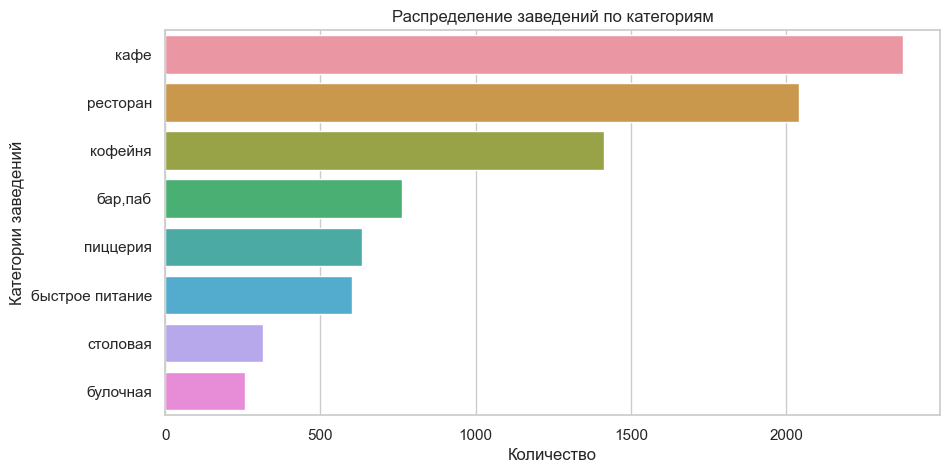

In [17]:
# построим визуализацию
plt.figure(figsize=(10,5))
sns.set(context='notebook', style='whitegrid', palette='inferno', font='sans-serif', font_scale=1, color_codes=False, rc=None)
sns.barplot(x='total', y='category', data=df_category)
plt.title('Распределение заведений по категориям')
plt.xlabel('Количество') 
plt.ylabel('Категории заведений')
plt.show()

Согласно визуализации видим, что больше всего распространенны кафе, рестораны и кофейни, меньше же всего столовые и булочные.

### Количество посадочных мест в местах по категориям 

In [18]:
# посчитаем медианное и общее количество посадочных мест по категориям заведений
df_category_seats = df.pivot_table(index='category', values='seats', aggfunc=['median', 'sum'])\
                    .droplevel(1, axis=1).apply(np.floor)
df_category_seats.columns=['median', 'total']
df_category_seats = df_category_seats.reset_index()
df_category_seats

,category,median,total
0,"бар,паб",82.0,58131.0
1,булочная,50.0,13229.0
2,быстрое питание,65.0,34513.0
3,кафе,60.0,118494.0
4,кофейня,80.0,83511.0
5,пиццерия,55.0,40350.0
6,ресторан,86.0,154681.0
7,столовая,75.0,16359.0


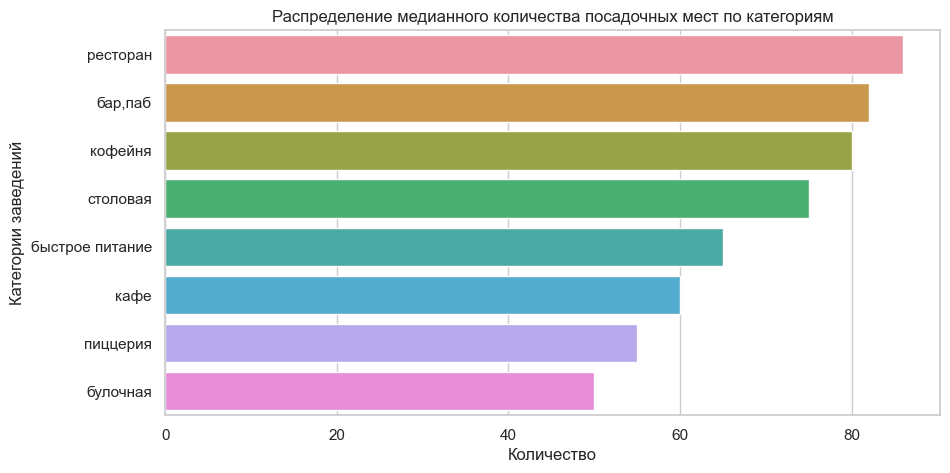

In [19]:
# построим визуализацию медианного количества мест по категориям заведений
plt.figure(figsize=(10,5))
sns.barplot(x='median', y='category', data=df_category_seats.sort_values(by='median',ascending=False))
plt.title('Распределение медианного количества посадочных мест по категориям')
plt.xlabel('Количество') 
plt.ylabel('Категории заведений')
plt.show()

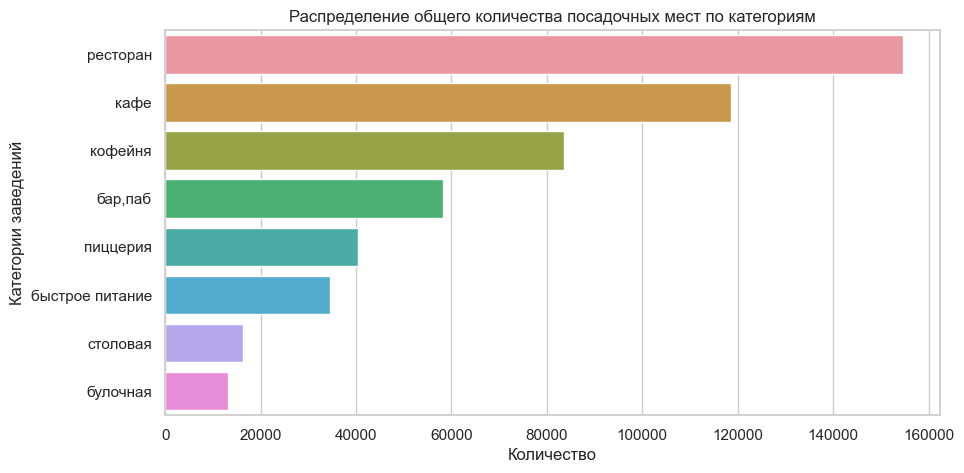

In [20]:
# построим визуализацию общего количества мест по категориям заведений
plt.figure(figsize=(10,5))
sns.barplot(x='total', y='category', data=df_category_seats.sort_values(by='total',ascending=False))
plt.title('Распределение общего количества посадочных мест по категориям')
plt.xlabel('Количество') 
plt.ylabel('Категории заведений')
plt.show()

Видим, что самое большое количество посадочных мест в ресторанах, а самое минимальное в булочных.

### Cоотношение сетевых и несетевых заведений в датасете

In [21]:
# посчитаем общее количество сетевых и не сетевых заведений
df_chain = df.groupby('chain')['name'].count().reset_index().rename(columns={'name':'total'})
df_chain.loc[df_chain['chain'] == 0, 'chain'] = 'несетевые'
df_chain.loc[df_chain['chain'] == 1, 'chain'] = 'сетевые'
df_chain

,chain,total
0,несетевые,5200
1,сетевые,3203


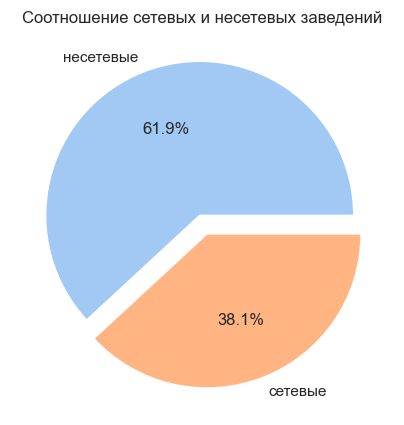

In [22]:
# построим визуализацию соотношения сетевых и несетевых заведений
plt.figure(figsize=(5,5))
colors = sns.color_palette('pastel')
explode = [0.05, 0.08]
plt.pie(df_chain['total'], labels=df_chain['chain'], autopct='%.1f%%', explode=explode, colors=colors)
plt.title('Соотношение сетевых и несетевых заведений')
plt.show()

Видим, что несетевых заведений больше - 61,9%.

In [23]:
# посчитаем количество сетевых заведений по категориям, общее количество сетевых и несетевых заведений и 
# долю cетевых от общего количества заведений
df_category_chain = df.pivot_table(index='category', values='chain', aggfunc=['sum', 'count']).droplevel(1, axis=1)
df_category_chain.columns=['count_chain', 'total']
df_category_chain = df_category_chain.reset_index()
df_category_chain['percent'] = ((df_category_chain['count_chain'] / df_category_chain['total'])*100).round()
df_category_chain.sort_values(by='percent', ascending=False)

,category,count_chain,total,percent
1,булочная,157,256,61.0
5,пиццерия,330,633,52.0
4,кофейня,720,1413,51.0
2,быстрое питание,232,603,38.0
6,ресторан,729,2042,36.0
3,кафе,779,2377,33.0
7,столовая,88,315,28.0
0,"бар,паб",168,764,22.0


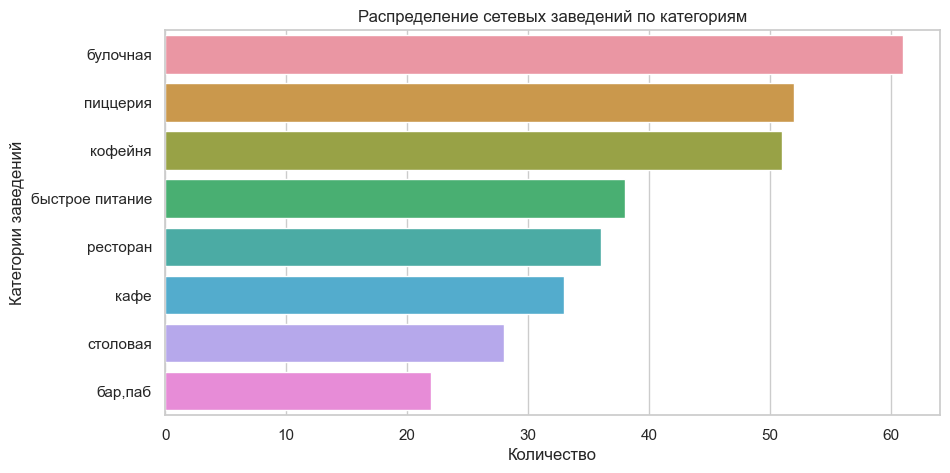

In [24]:
# построим визуализацию количества сетевых заведений по категориям
plt.figure(figsize=(10,5))
sns.barplot(x='percent', y='category', data=df_category_chain.sort_values(by='percent',ascending=False))
plt.title('Распределение сетевых заведений по категориям')
plt.xlabel('Количество') 
plt.ylabel('Категории заведений')
plt.show()

Видим, что самыми распространнеными сетевыми заведениями являются булочная, пиццерия и кофейня; на последнем месте бар, паб.

### Топ-15 популярных сетей в Москве

In [25]:
# составим топ-15 по количеству заведений каждой сети в регионе
top_15 = (
    df.query('chain == 1').pivot_table(index=['name', 'category'], values='chain', aggfunc='count').reset_index()
    .sort_values(by='chain', ascending=False).rename(columns={'chain':'count'}).head(15)
)
top_15

,name,category,count
1126,шоколадница,кофейня,119
496,домино'с пицца,пиццерия,76
489,додо пицца,пиццерия,74
205,one price coffee,кофейня,71
1142,яндекс лавка,ресторан,69
72,cofix,кофейня,65
241,prime,ресторан,49
617,кофепорт,кофейня,42
632,кулинарная лавка братьев караваевых,кафе,39
963,теремок,ресторан,36


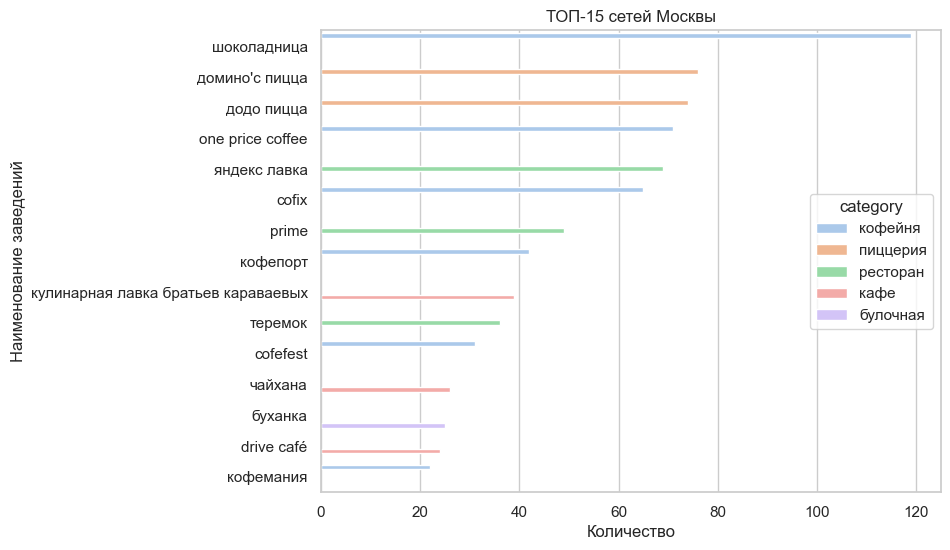

In [26]:
# построим визуализацию топ-15 по количеству заведений каждой сети в регионе
plt.figure(figsize=(8,6))
sns.barplot(x='count',y= 'name', hue = 'category',data=top_15, palette = 'pastel')
plt.xlabel('Количество')
plt.ylabel('Наименование заведений')
plt.title('ТОП-15 сетей Москвы')
plt.show()

Видим, что самыми большими сетевыми заведениями (первые шесть заведений) являются - Шоколадница, Доминос пицца, Додо пицца, one price coffee, яндекс лавка и cofix. Cамым маленьким сетевым заведением является - кофемания.

### Какие административные районы Москвы присутствуют в датасете

In [27]:
# посмотрим на количество заведений в каждом административном районе Москвы
df_district = df.groupby('district')['name'].count().reset_index().rename(columns={'name':'total'})\
                .sort_values(by='total',ascending=False)
df_district

,district,total
5,Центральный административный округ,2242
2,Северный административный округ,899
8,Южный административный округ,892
3,Северо-Восточный административный округ,890
1,Западный административный округ,850
0,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
4,Северо-Западный административный округ,409


In [28]:
# добавим в таблицу столбцы с информацией о количество заведений каждой категории по районам и их долю от общего количества
df_district_category = df.groupby(['district', 'category'], as_index=False)['name'].count()\
                        .rename(columns={'name':'count'})
df_district_category_total = df_district_category.merge(df_district, how='inner', on='district')
df_district_category_total['percent'] = ((df_district_category_total['count'] / df_district_category_total['total'])\
                                         *100).round(1)
df_district_category_total

,district,category,count,total,percent
0,Восточный административный округ,"бар,паб",53,798,6.6
1,Восточный административный округ,булочная,25,798,3.1
2,Восточный административный округ,быстрое питание,71,798,8.9
3,Восточный административный округ,кафе,272,798,34.1
4,Восточный административный округ,кофейня,105,798,13.2
...,...,...,...,...,...
67,Южный административный округ,кафе,264,892,29.6
68,Южный административный округ,кофейня,131,892,14.7
69,Южный административный округ,пиццерия,73,892,8.2
70,Южный административный округ,ресторан,202,892,22.6


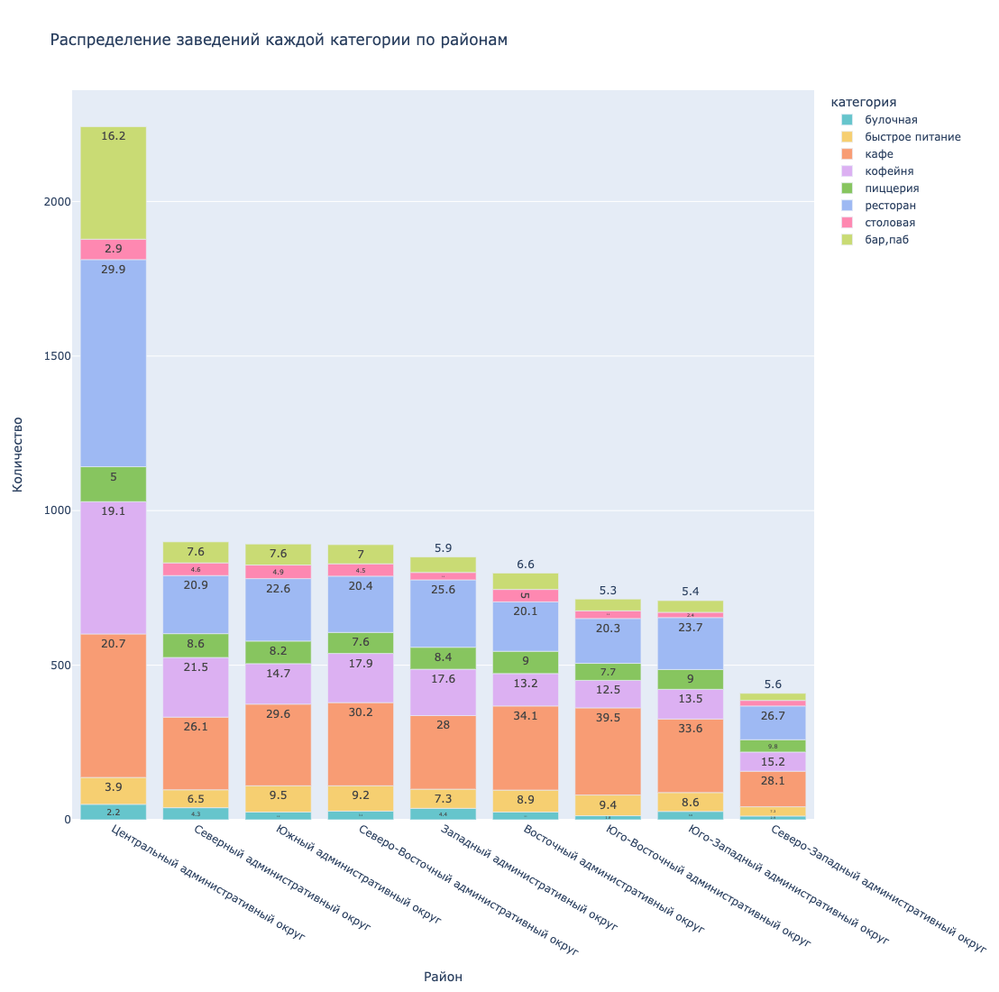

In [54]:
# построим визуализацию распределения заведений каждой категории по районам
fig = px.bar(df_district_category_total.sort_values(by='total', ascending=False), 
             x='district', 
             y='count', 
             title='Распределение заведений каждой категории по районам', 
             color='category',
             height= 1100,
             text='percent', 
             color_discrete_sequence=px.colors.qualitative.Pastel,
             labels={'total': 'количество', 'district': 'район', 'category': 'категория'},)
fig.update_xaxes(title='Район')
fig.update_yaxes(title='Количество')
fig.show()

Видим, что больше всего заведений расположенно в центральном административном округе, в основном это бары, рестораны, кофейни и кафе. Самым не популярным округом является - СЗАО.

### Визуализация распределение средних рейтингов по категориям заведений

In [30]:
# посмотрим на средний рейтинг по категориям заведений
rating_mean = df.groupby('category').agg({'rating':'mean'}).round(2).sort_values(by='rating', ascending=False).reset_index()
rating_mean

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


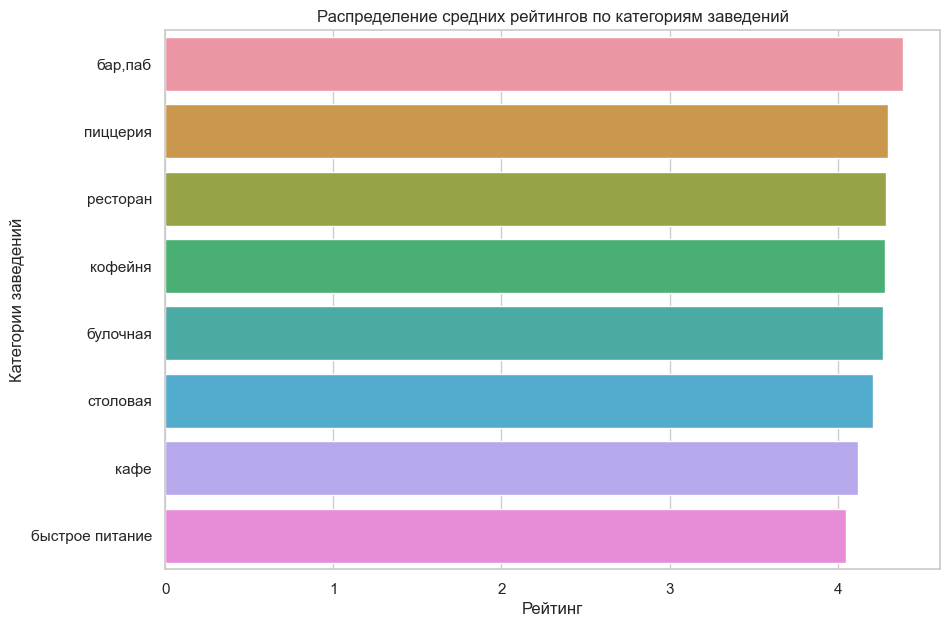

In [31]:
# построим визуализацию распределения средних рейтингов по категориям заведений
plt.figure(figsize=(10,7))
sns.barplot(x='rating', y='category', data=rating_mean.sort_values(by='rating',ascending=False))
plt.title('Распределение средних рейтингов по категориям заведений')
plt.xlabel('Рейтинг') 
plt.ylabel('Категории заведений')
plt.show()

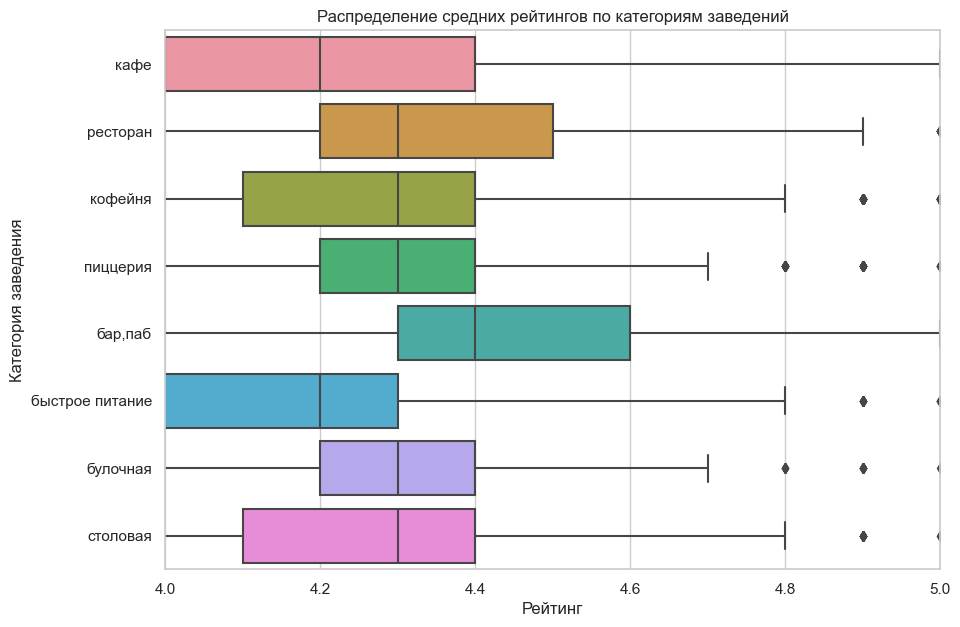

In [32]:
# построим боксплот распределения рейтингов по категориям заведений
plt.figure(figsize=(10, 7))
sns.boxplot(x='rating', y='category', data=df) 
plt.xlabel('Рейтинг')
plt.ylabel('Категория заведения')
plt.xlim(4, 5)
plt.title('Распределение средних рейтингов по категориям заведений')
plt.show()

Исходя из полученных данных, видим, что средние рейтинги у всех категорий заведений примерно одинаковые, лидирует категория - бар, паб; на последнем месте - быстрое питание.

### Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района

In [33]:
# определим средний рейтинг заведений каждого района
rating_mean_dis = df.groupby('district', as_index=False)['rating'].agg('mean')

state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_mean_dis,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.7,
    legend_name='Средний рейтинг заведений каждого района',
).add_to(m)
m

### Все заведения датасета на карте с помощью кластеров средствами библиотеки folium

In [34]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

### Топ-15 улиц по количеству заведений

In [35]:
# определим топ-15 улиц по количеству заведений
top_15_street = (
    df.pivot_table(index=['street'], values='name', aggfunc='count').reset_index()
    .sort_values(by='name', ascending=False).rename(columns={'name':'total'}).head(15)
)
top_15_street

,street,total
1090,проспект Мира,183
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


In [36]:
# посчитаем количество заведений и их категорий по улицам, общее количество заведений для каждой улицы и 
# долю заведений от этого общего количества
df_street_cat = (
    df.pivot_table(index=['street', 'category'], values='name', aggfunc='count').reset_index()
    .rename(columns={'name':'total'}).sort_values(by='total', ascending=False)
)

top_15_street_cat = df_street_cat.merge(top_15_street, how='inner', on='street')
top_15_street_cat.columns = ['street', 'category', 'count', 'total']
top_15_street_cat
top_15_street_cat['percent'] = ((top_15_street_cat['count'] / top_15_street_cat['total'])*100).round(1)
top_15_street_cat

,street,category,count,total,percent
0,проспект Мира,кафе,53,183,29.0
1,проспект Мира,ресторан,45,183,24.6
2,проспект Мира,кофейня,36,183,19.7
3,проспект Мира,быстрое питание,21,183,11.5
4,проспект Мира,пиццерия,11,183,6.0
...,...,...,...,...,...
106,улица Вавилова,быстрое питание,11,55,20.0
107,улица Вавилова,кофейня,10,55,18.2
108,улица Вавилова,пиццерия,3,55,5.5
109,улица Вавилова,"бар,паб",2,55,3.6


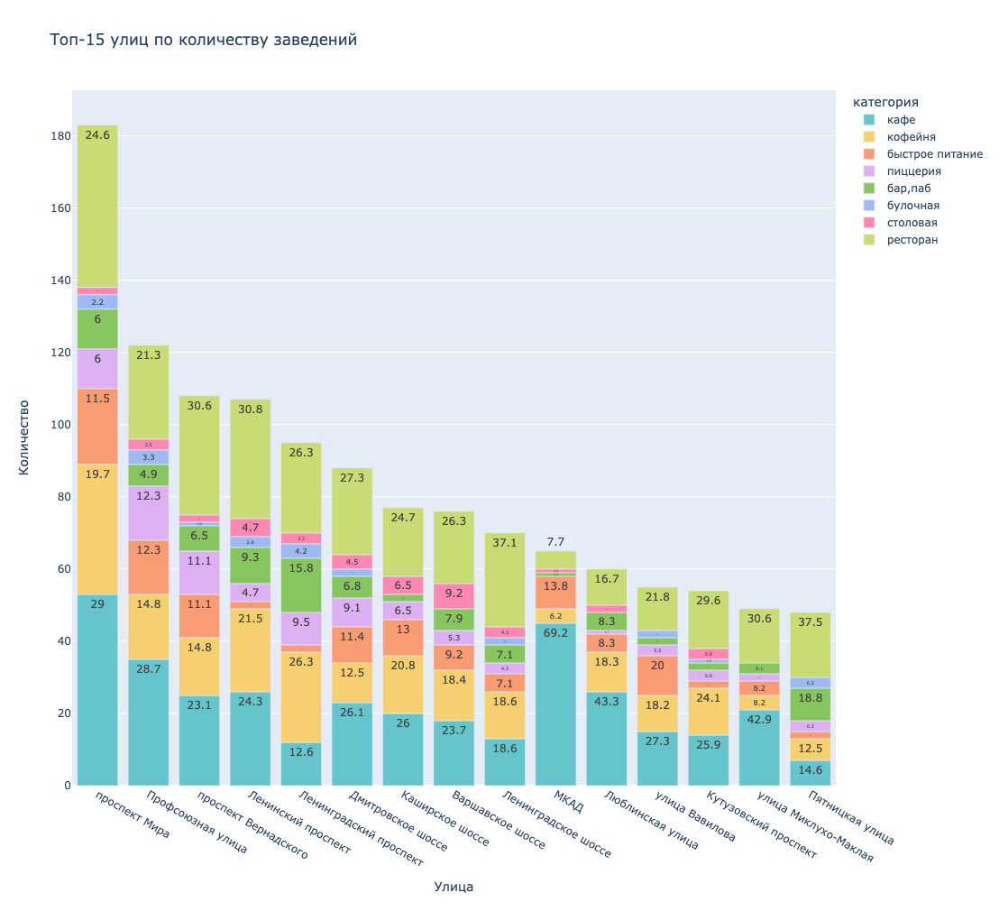

In [55]:
# построим визуализацию для топа-15 улиц по количеству заведений
fig = px.bar(top_15_street_cat.sort_values(by='total', ascending=False), 
             x='street', 
             y='count', 
             text='percent', 
             title='Топ-15 улиц по количеству заведений', 
             color='category',
             labels={'count': 'кол-во заведений', 'street': 'улица', 'category': 'категория'},
             height= 1000,
             color_discrete_sequence=px.colors.qualitative.Pastel)
fig.update_xaxes(title='Улица')
fig.update_yaxes(title='Количество')
fig.show()

Видим, что больше всего заведений располагается на проспекте Мира, большая часть из них это кафе, рестораны и кофейни. Меньше всего заведений на Пятницкой улице, там же самым распрастраненной категорией заведений является рестораны.

### Улицы, на которых находится только один объект общепита

In [38]:
# определим улицы и их округа, на которых расположен один общепит
df_name_one = (
    df.pivot_table(index=['district', 'street'], 
                   values='name', 
                   aggfunc='count').reset_index().rename(columns={'name':'count'}).query('count==1')
)
df_name_one

,district,street,count
0,Восточный административный округ,1-й Кирпичный переулок,1
3,Восточный административный округ,1-я Боевская улица,1
6,Восточный административный округ,1-я Парковая улица,1
7,Восточный административный округ,11-я Парковая улица,1
8,Восточный административный округ,12-я Парковая улица,1
...,...,...,...
1485,Южный административный округ,улица Садовники,1
1488,Южный административный округ,улица Стасовой,1
1489,Южный административный округ,улица Трофимова,1
1492,Южный административный округ,улица Шухова,1


In [39]:
data_street = df_name_one.merge(df, on='street', how='left')
data_street['category'].value_counts()

кафе               259
ресторан           137
кофейня            108
бар,паб             55
столовая            45
быстрое питание     41
пиццерия            25
булочная            14
Name: category, dtype: int64

In [40]:
# определим общее количество таких улиц для каждого района и их долю от общего количества
df_district_name_one = (
    df_name_one.groupby('district', as_index=False)['street'].count().rename(columns={'street':'total'})
    .sort_values(by='total', ascending=False)
)
df_district_name_one['percent'] = ((df_district_name_one['total'] / df_district['total'])*100).round(2)
df_district_name_one = df_district_name_one.sort_values(by='percent', ascending=False)
df_district_name_one

,district,total,percent
5,Центральный административный округ,148,6.60
0,Восточный административный округ,52,6.52
3,Северо-Восточный административный округ,56,6.29
2,Северный административный округ,53,5.90
6,Юго-Восточный административный округ,42,5.88
8,Южный административный округ,50,5.61
4,Северо-Западный административный округ,21,5.13
1,Западный административный округ,36,4.24
7,Юго-Западный административный округ,18,2.54


Исходя из полученных данных, видим, что улиц с одним общепитом аж 476, большая часть таких улиц, а именно 148 - находятся в центральном администраттивном округе. На последнем месте - юго-западный административный округ, в нем улиц с одним общепитом находится всего лишь 18.

### Фоновая картограмма (хороплет) со средним чеком для каждого района

In [41]:
# определим медиану средних чеков для каждого района
df_avg_bill = df.groupby('district', as_index=False)['middle_avg_bill'].median().sort_values(by='middle_avg_bill', 
                                                                                             ascending=False)
df_avg_bill

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [42]:
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=df_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.7,
    legend_name='Средний чек заведений каждого района',
).add_to(m)
m

Видим, что самый высокий средний чек у западного и центрального административного округа, самый низкий - северо-восточного, южного и южно-восточного округов. Средний чек в центре почти в полтара раза выше, чем в других округах.

**Вывод**

В результате анализа данных было определенно:
    
    - больше всего распространенны кафе (28,29%), рестораны (24,3%) и кофейни (16,82%), меньше же всего столовые (3,75%) и булочные (3,05%);
    - самое большое количество посадочных мест в ресторанах, а самое минимальное в булочных;
    - несетевых заведений больше, а именно 61,9%;
    - Видим, что самыми распространнеными сетевыми заведениями являются булочная (61%), пиццерия (52%) и кофейня (51%); на последнем месте бар, паб (22%);
    - самыми большими сетевыми заведениями в топ-15 по количеству заведений каждой сети в регионе являются - Шоколадница, Доминос пицца, Додо пицца, one price coffee, яндекс лавка и cofix. Cамым маленьким сетевым заведением является - кофемания;
    - больше всего заведений расположенно в центральном административном округе, в основном это бары, рестораны, кофейни и кафе. Самым не популярным округом является - СЗАО;
    - средние рейтинги у всех категорий заведений примерно одинаковые, лидирует категория - бар, паб (4,39%), на последнем месте - быстрое питание (4,05%);
    - больше всего заведений располагается на проспекте Мира, большая часть из них это кафе, рестораны и кофейни. Меньше всего заведений на Пятницкой улице, там же самым распрастраненной категорией заведений является рестораны.
    - улиц с одним общепитом аж 476, большая часть таких улиц, а именно 6,6% - находятся в центральном административном округе. На последнем месте - юго-западный административный округ, в нем улиц с одним общепитом находится всего лишь 2,54%;
    - самый высокий средний чек у заведений западного и центрального административного округа - 1000руб, самый низкий - северо-восточного, южного и южно-восточного округов. Средний чек в центре почти в полтара раза выше, чем в других округах.

## Детализированное исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуем определить, осуществима ли мечта клиентов. Проведем исследование, чтобы дать рекомендации для открытия нового заведения.

### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [43]:
# определим сколько всего кофеен в датасете
coffee_total = df.query('category == "кофейня"')
coffee_total['name'].count()

1413

In [44]:
# определим в каких районах кофеен больше всего
df_coffee_dis = (
    coffee_total.groupby('district', as_index=False)['name'].count().rename(columns={'name':'total'})
    .sort_values(by='total', ascending=False)
)
df_coffee_dis

,district,total
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


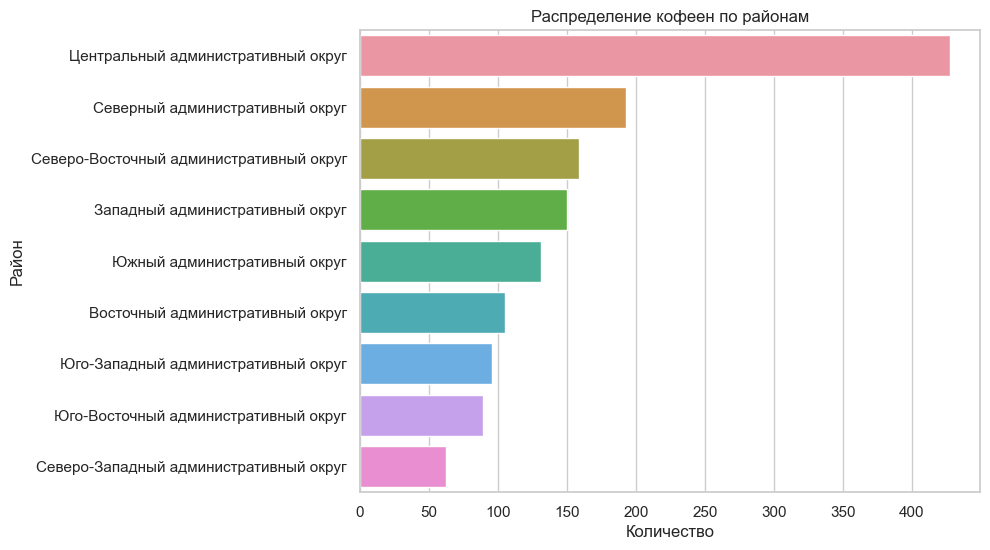

In [45]:
# построим визуализацию распределения кофеен по районам
plt.figure(figsize=(8,6))
sns.barplot(x='total',y= 'district', data=df_coffee_dis)
plt.xlabel('Количество')
plt.ylabel('Район')
plt.title('Распределение кофеен по районам')
plt.show()

In [46]:
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=df_coffee_dis,
    columns=['district', 'total'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.7,
    legend_name='Средний чек заведений каждого района',
).add_to(m)
m

По полученным данным определили, что всего кофеен в датасете - 1413, больше всего кофеен располагается в центральном административном округе, а именно 428, в основном большинство кофеен располагаются у станций метро, торговых и деловых центров, парков.

### Есть ли круглосуточные кофейни?

In [47]:
# определим количество круглосуточных кофеен
coffee_24_7 = df.query('(category == "кофейня") and (is_24_7 == True)')
coffee_24_7['name'].count()

59

In [48]:
# определим количество круглосуточных кофеен по округам
coffee_24_7_dis = (
    coffee_24_7.groupby('district', as_index=False)['name'].count()
    .rename(columns={'name':'total'}).sort_values(by='total', ascending=False)
)
coffee_24_7_dis

,district,total
5,Центральный административный округ,26
1,Западный административный округ,9
7,Юго-Западный административный округ,7
0,Восточный административный округ,5
2,Северный административный округ,5
3,Северо-Восточный административный округ,3
4,Северо-Западный административный округ,2
6,Юго-Восточный административный округ,1
8,Южный административный округ,1


In [49]:
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_24_7_dis,
    columns=['district', 'total'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.7,
    legend_name='Средний чек заведений каждого района',
).add_to(m)
m

Видим, что большинство круглосуточных кофеен, а именно 26 заведений располагается в центральном административном округе. Всего круглосуточных кофеен в Москве 59. Исходя из такого количества круглосуточных кофеен - они явно не имеют сильного спроса.

### Какие у кофеен рейтинги? Как они распределяются по районам?

In [50]:
# определим средние рейтинги кофеен
coffee_rating = df.query('category == "кофейня"')
coffee_rating = coffee_rating.groupby('district').agg({'rating':'mean'}).round(2).sort_values(by='rating', ascending=False).reset_index()
coffee_rating

,district,rating
0,Центральный административный округ,4.34
1,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
3,Восточный административный округ,4.28
4,Юго-Западный административный округ,4.28
5,Юго-Восточный административный округ,4.23
6,Южный административный округ,4.23
7,Северо-Восточный административный округ,4.22
8,Западный административный округ,4.20


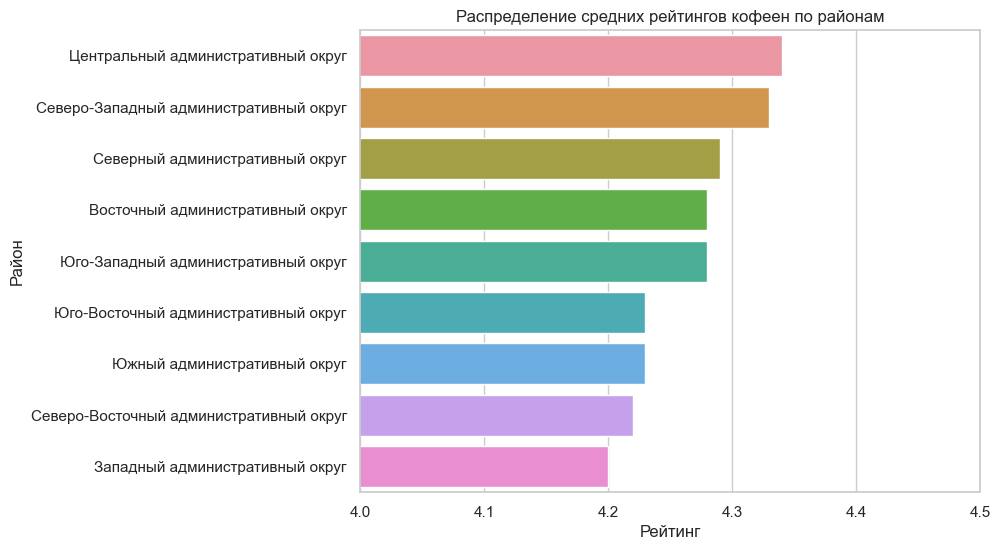

In [51]:
# построим визуализацию распределения cредних рейтингов кофеен по районам
plt.figure(figsize=(8,6))
sns.barplot(x='rating',y= 'district', data=coffee_rating)
plt.xlim(4,4.5) 
plt.xlabel('Рейтинг')
plt.ylabel('Район')
plt.title('Распределение cредних рейтингов кофеен по районам')
plt.show()

Видим, что рейтингы кофеен по районам примерно одинаковые, самый высокий рейтинг в центральном административном округе и составляет 4,34, самый низкий в западном административном округе и составляет 4,20.

### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [52]:
# определим медианную стоимость чашки капучино для каждого округа
df_coffee_cup = (
    coffee_total.groupby('district', as_index=False)['middle_coffee_cup'].median()
    .rename(columns={'middle_coffee_cup':'median_coffee_cup'}).sort_values(by='median_coffee_cup', ascending=False)
)
df_coffee_cup

,district,median_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


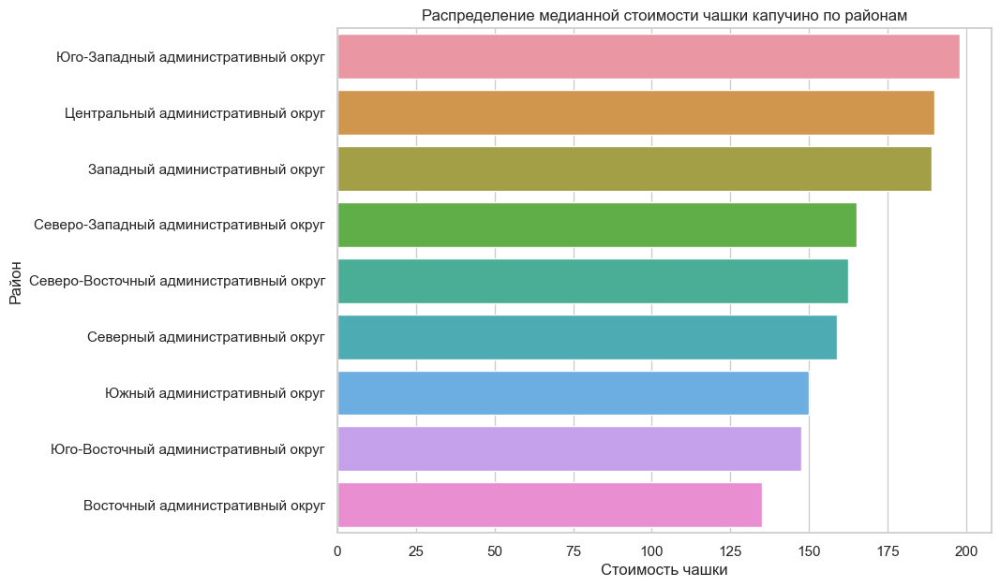

In [53]:
# построим визуализацию распределения медианной стоимости чашки капучино по районам
plt.figure(figsize=(9,7))
sns.barplot(x='median_coffee_cup',y='district', data=df_coffee_cup)
plt.xlabel('Стоимость чашки')
plt.ylabel('Район')
plt.title('Распределение медианной стоимости чашки капучино по районам')
plt.show()

Видим, что самая самая высокая медианная стоимость чашки капучино наблюдается в юго-западном административном округе и составляет 198 рублей, самая низкая стоимость в восточном административном округе - 135 рублей. Предполагаю, что ориентироваться по стоимости чашки капучино лучше исходя из расположения кофейни, а точней в каком округе она будет находится.

**Вывод**

Исходя из нашего детализированного анализа можно сделать следующие выводы и рекомендации для открытия кофейни:

Самая высокая стоимость чашки капучино в юго-западном, центральном и западном административном округе. Рейтинг кофеен в зависимости от расположения примерно одинаковый, поэтому прежде всего рекомендую открытие кофейни в юго-западном и западном административном округе. Центральный округ - лидер по количеству кофеен, следовательно там возможен переизбыток данных заведений, да и данный округ явно является самым дорогостоящим для открытия кофейни. 

Также думаю, что можно рассмотреть вариант круглосуточной кофейни в этих округах, прдеварительно рассчитав прибыльность такого формата в данных округах. В юго-западном и западном округе кофейни такого формата есть, их не так много как в центральном, поэтому конкуренция не такая высокая.

## Презентация

https://disk.yandex.ru/i/J3yT06cxJZOtJA

Спасибо за внимание!